In [9]:
from datasketch import MinHash

# data1 = [32, 3, 22, 6, 15, 11]
# data2 = [15, 30, 7, 11, 28, 3,17]

m1 = MinHash()
m2 = MinHash()

for d in data1:
    m1.update(str(d).encode('utf8'))
for d in data2:
    m2.update(str(d).encode('utf8'))
print("Estimated Jaccard for data1 and data2 is", m1.jaccard(m2))

s1 = set(data1)
s2 = set(data2)
actual_jaccard = float(len(s1.intersection(s2)))/float(len(s1.union(s2)))
print("Actual Jaccard for data1 and data2 is", actual_jaccard)

Estimated Jaccard for data1 and data2 is 0.296875
Actual Jaccard for data1 and data2 is 0.3


In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import itertools
import time
from datasketch import MinHash

In [3]:
def cdist_sparse( X, Y, **kwargs ):
    """ -> |X| x |Y| cdist array, any cdist metric
        X or Y may be sparse -- best csr
    """
        # todense row at a time, v slow if both v sparse
    sxy = 2*issparse(X) + issparse(Y)
    if sxy == 0:
        return cdist( X, Y, **kwargs )
    d = np.empty( (X.shape[0], Y.shape[0]), np.float64 )
    if sxy == 2:
        for j, x in enumerate(X):
            d[j] = cdist( x.todense(), Y, **kwargs ) [0]
    elif sxy == 1:
        for k, y in enumerate(Y):
            d[:,k] = cdist( X, y.todense(), **kwargs ) [0]
    else:
        for j, x in enumerate(X):
            for k, y in enumerate(Y):
                d[j,k] = cdist( x.todense(), y.todense(), **kwargs ) [0]
    return d

In [48]:
cap = cv2.VideoCapture('movie.mp4')
# Frame shape-(720x1280)
fps = cap.get(cv2.CAP_PROP_FPS)
frames = []
corners = []
descriptors_h =[]
descriptors_m =[]
i=0
frame_no=0

retval=cv2.xfeatures2d.HarrisLaplaceFeatureDetector_create(6,0.01,0.01,5000,4)
mser = cv2.MSER_create()
sift = cv2.xfeatures2d.SIFT_create()
count = 0
while(i<=2000):
    i=i+1
    ret, frame = cap.read()
    if ret == True:
        if(i == 1+(int(fps)*frame_no)): #Reading 1 frame per second as FPS         
            frame_no += 1
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            frames.append(frame)
            
            keypoints_h, descriptors_harris = sift.compute(frame,retval.detect(frame,None))
            keypoints_m, descriptors_mser = sift.compute(frame,mser.detect(frame))
            
            if descriptors_harris is not None:
                descriptors_h.append(descriptors_harris)
            if descriptors_mser is not None:
                descriptors_m.append(descriptors_mser)      

    else: 
        break

# When everything done, release the video capture object
cap.release() 
# Closes all the frames
cv2.destroyAllWindows()
        
frames = np.stack(frames)

merged_h = list(itertools.chain.from_iterable(descriptors_h))
merged_h = np.stack(merged_h)

merged_m = list(itertools.chain.from_iterable(descriptors_m))
merged_m = np.stack(merged_m)

cluster_size_h = 2000
cluster_size_m = 2000

In [49]:
len(frames)

87

In [6]:
cluster_h = np.loadtxt('../text/centres_h.txt', dtype=float),np.loadtxt('../text/xtoc_h.txt', dtype=float),np.loadtxt('../text/distances_h.txt', dtype=float)

In [10]:
cluster_h = np.load('logo_centres_h.npy',allow_pickle=True),np.load('logo_xtoc_h.npy',allow_pickle=True),np.load('logo_distances_h.npy',allow_pickle=True)
# cluster_h[1] = np.load('logo_xtoc_h.npy')
# cluster_h[2] = np.load('logo_distances_h.npy')

In [45]:
cluster_h = np.loadtxt('../text/centres_h.txt', dtype=float),np.loadtxt('../text/xtoc_h.txt', dtype=float),np.loadtxt('../text/distances_h.txt', dtype=float)
# freqMat_h = np.loadtxt('../text/freqMat_h.txt', dtype=float)

In [ ]:
cluster_centre = np.load('logo_centres_h.npy',allow_pickle=True)
cluster_xtoc = np.load('logo_xtoc_h.npy',allow_pickle=True)
cluster_distance = np.load('logo_distances_h.npy',allow_pickle=True)

In [50]:
from scipy.sparse import issparse
from scipy.spatial.distance import cdist
a = []
for i in range(len(frames)):
        D = cdist_sparse( descriptors_h[i], cluster_h[0], metric='mahalanobis')
        xtoc = D.argmin(axis=1)
        a.append(tuple(set(xtoc)))

In [72]:
np.save('a.npy',a)

In [75]:
a = np.load('a.npy',allow_pickle=True)

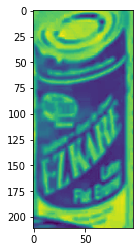

In [169]:
# Select ROI to test
if __name__ == '__main__' :
    im = frames[33]
    r = cv2.selectROI(im)
    imCrop = im[int(r[1]):int(r[1]+r[3]), int(r[0]):int(r[0]+r[2])]
    plt.imshow(imCrop)
    np.save('imCrop',imCrop)

In [93]:
imCrop = np.load('./Groundhogday/ObjectQuery2.npy')

In [94]:
# Get features of selected region
f = imCrop.copy()
retval=cv2.xfeatures2d.HarrisLaplaceFeatureDetector_create(6,0.01,0.01,5000,4)
sift = cv2.xfeatures2d.SIFT_create()

region_keypoints_h, region_descriptors_harris = sift.compute(f,retval.detect(f,None))

D = cdist_sparse( region_descriptors_harris, cluster_h[0], metric='mahalanobis') #shape of D is len(descriptors) x no of clusters (K)
xtoc = D.argmin(axis=1) #shape of xtoc is len(descriptors,)
roi = tuple(set(xtoc))

m_roi = MinHash(num_perm=10000)
for d in roi:
    m_roi.update(str(d).encode('utf8'))

jaccards = []
for i in range(len(frames)):
    m1 = MinHash(num_perm=10000)
    for d in a[i]:
        m1.update(str(d).encode('utf8'))
    jaccards.append(m1.jaccard(m_roi))

/home/chaitra/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # This is added back by InteractiveShellApp.init_path()


<Figure size 1332x756 with 0 Axes>

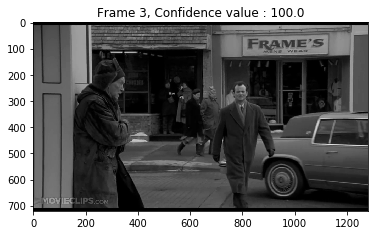

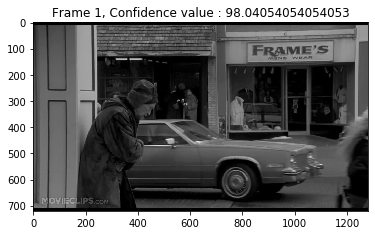

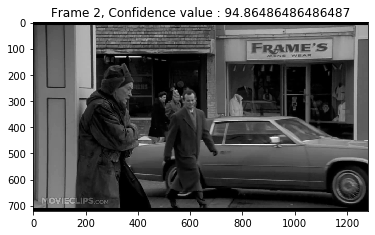

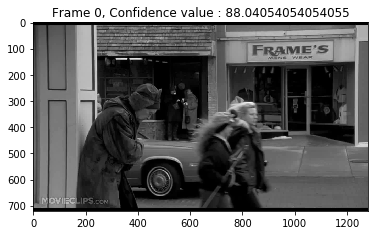

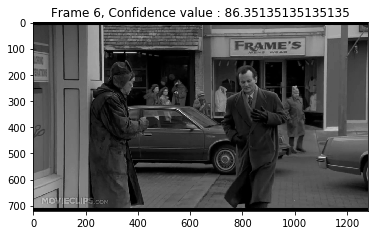

...

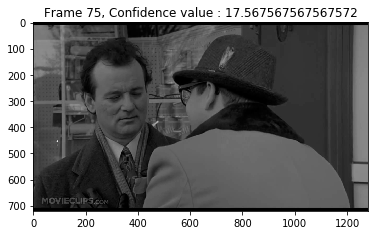

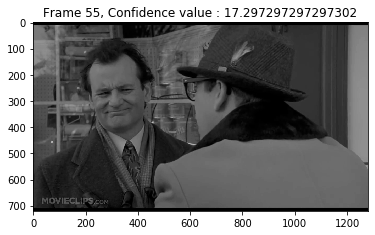

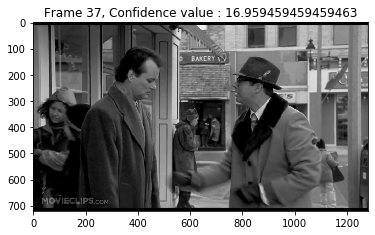

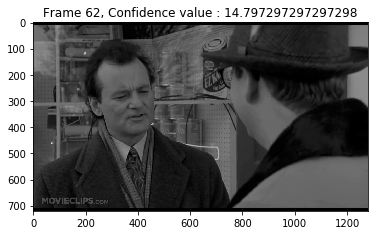

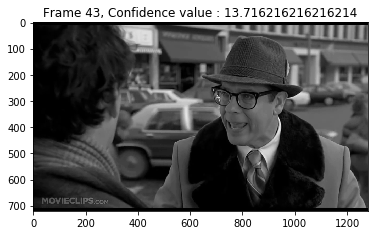

In [95]:
%matplotlib inline
c = np.asarray(jaccards)
maxi=np.max(c)
mini=np.min(c)
c=(c-mini)/(maxi-mini)
jaccards_sorted = c.argsort(axis=0)[::-1][:len(c)]
fig = plt.figure()
fig.set_size_inches(18.5, 10.5)
for i in range (50):
#     fig.add_subplot(3,3,i+1)
    plt.figure()
    plt.imshow(frames[jaccards_sorted[i]],cmap='gray')
    plt.title('Frame '+str(jaccards_sorted[i])+', Confidence value : '+str(c[jaccards_sorted[i]]*100))
#     plt.figure()
fig.tight_layout()
# fig.savefig('test5.png', dpi=100)

/home/chaitra/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


78


<Figure size 1080x720 with 0 Axes>

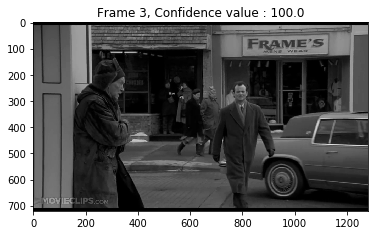

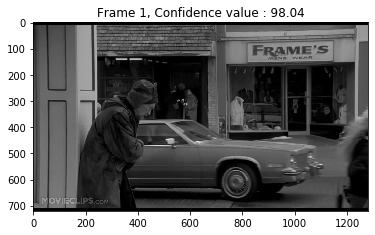

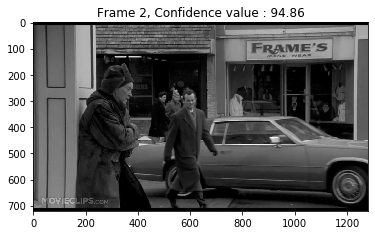

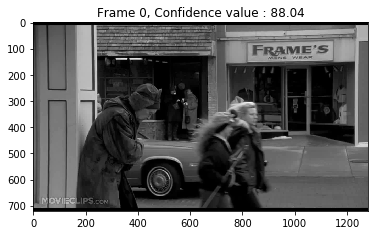

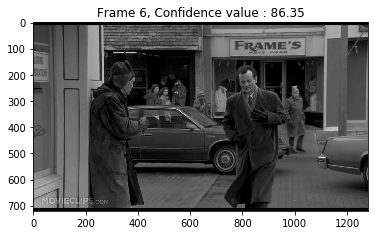

...

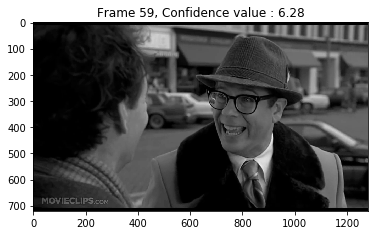

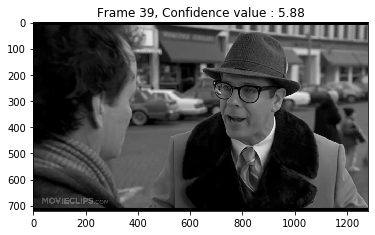

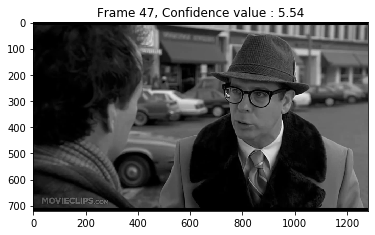

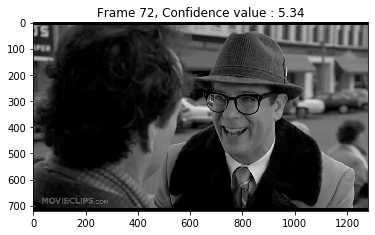

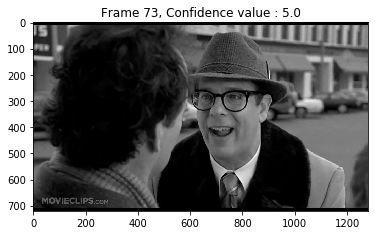

In [130]:
th = 5
count=0
fig=plt.figure()
fig.set_size_inches(15, 10)
for i in range (len(frames)):
    if (c[jaccards_sorted[i]]*100>=th):
        count+=1
        plt.figure()
#         fig.add_subplot(4,4,i+1)
        plt.imshow(frames[jaccards_sorted[i]],cmap='gray')
        plt.title('Frame '+str(jaccards_sorted[i])+', Confidence value : '+str(round(c[jaccards_sorted[i]]*100,2)))
fig.tight_layout()
print(count)

9


<Figure size 1080x720 with 0 Axes>

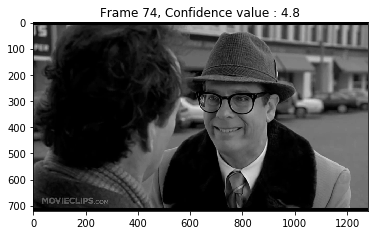

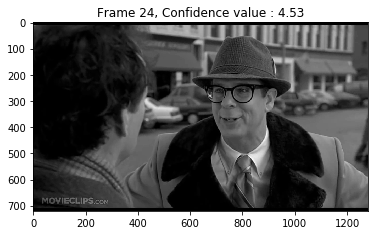

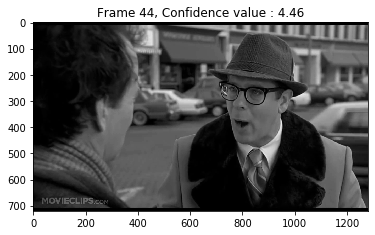

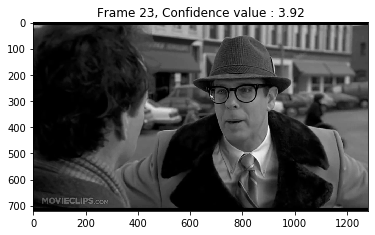

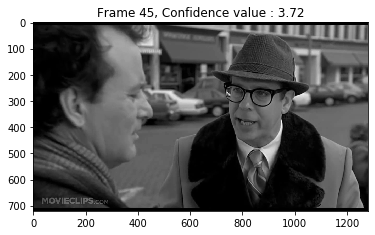

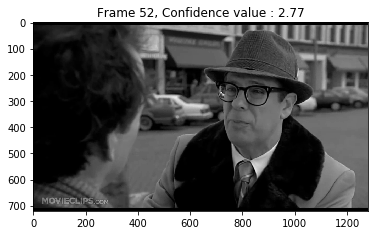

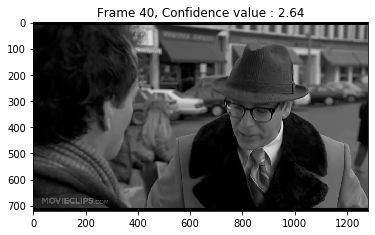

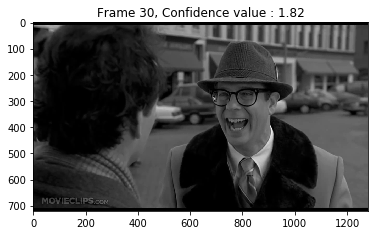

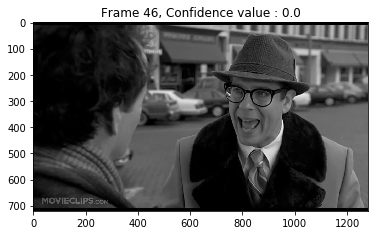

In [113]:
th = 5
count=0
fig=plt.figure()
fig.set_size_inches(15, 10)
for i in range (len(frames)):
    if (c[jaccards_sorted[i]]*100<th):
        count+=1
        plt.figure()
#         fig.add_subplot(4,4,i+1)
        plt.imshow(frames[jaccards_sorted[i]],cmap='gray')
        plt.title('Frame '+str(jaccards_sorted[i])+', Confidence value : '+str(round(c[jaccards_sorted[i]]*100,2)))
fig.tight_layout()
print(count)